In [1]:
import os
import csv
import torch
import numpy as np
import pandas as pd
from torch import nn
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from collections import Counter

## Intersection over Union

In [3]:
def intersection_over_union(bbox_preds,
                            bbox_true,
                            box_format="midpoint"):
    """
    Calculates intersection over union

    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct Labels of Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes (x,y,w,h) or (x1,y1,x2,y2)

    Returns:
        tensor: Intersection over union for all examples
    """

    # Slicing idx:idx+1 in order to keep tensor dimensionality
    # Doing ... in indexing if there would be additional dimensions
    # Like for Yolo algorithm which would have (N, S, S, 4) in shape

    if box_format == 'midpoint':
        box1_x1 = bbox_preds[..., 0:1] - bbox_preds[..., 2:3] / 2
        box1_y1 = bbox_preds[..., 1:2] - bbox_preds[..., 3:4] / 2
        box1_x2 = bbox_preds[..., 0:1] + bbox_preds[..., 2:3] / 2
        box1_y2 = bbox_preds[..., 1:2] + bbox_preds[..., 3:4] / 2

        box2_x1 = bbox_true[..., 0:1] - bbox_true[..., 2:3] / 2
        box2_y1 = bbox_true[..., 1:2] - bbox_true[..., 3:4] / 2
        box2_x2 = bbox_true[..., 0:1] + bbox_true[..., 2:3] / 2
        box2_y2 = bbox_true[..., 1:2] + bbox_true[..., 3:4] / 2

    elif box_format == 'corners':
        box1_x1 = bbox_preds[..., 0:1]
        box1_y1 = bbox_preds[..., 1:2]
        box1_x2 = bbox_preds[..., 2:3]
        box1_y2 = bbox_preds[..., 3:4] # (N, 1)

        box2_x1 = bbox_true[..., 0:1]
        box2_y1 = bbox_true[..., 1:2]
        box2_x2 = bbox_true[..., 2:3]
        box2_y2 = bbox_true[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    # .clamp(0) is for the case when they do not intersect
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    box1_area = abs((box1_x2 - box1_x1)) * (box1_y2 - box1_y1)
    box2_area = abs((box2_x2 - box2_x1)) * (box2_y2 - box2_y1)

    union = box1_area + box2_area - intersection + 1e-6

    return intersection / union

## Non-Maximum Suppression

In [4]:
def non_max_suppression(bbox_preds,
                        iou_threshold,
                        prob_threshold,
                        box_format='corners'):
    """
    Does Non Max Suppression given bboxes

    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU) 
        box_format (str): "midpoint" or "corners" used to specify bboxes

    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """
    
    # predictions = [[1, 0.9, x1, y1, x2, y2]]

    assert type(bbox_preds) == list

    bboxes = [box for box in bbox_preds if box[1] > prob_threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms

## Mean Average Precision (mAP)

In [5]:
def mean_average_precision(bbox_preds,
                           bbox_true,
                           iou_threshold=0.5,
                           box_format="midpoint",
                           num_classes=34):
    """
    Calculates mean average precision 

    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones 
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes

    Returns:
        float: mAP value across all classes given a specific IoU threshold 
    """

    # bbox_preds (list): [[train_idx, class_pred, prob_score, x1, y1, x2, y2], ...]

    # List storing all AP for respective classes
    average_precisions = []

    # Used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets and only add the ones that belong to the current class c
        for detection in bbox_preds:
            if detection[1] == c:
                detections.append(detection)

        for true_box in bbox_true:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get for each training example
        # So let's say img 0 has 3 bboxes, img 1 has 5 bboxes then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # Sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)

        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same training idx as detection
            ground_truth_img = [bbox for bbox in ground_truths if bbox[0] == detection[0]]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1
        
        # [1, 1, 0, 1, 0] -> [1, 2, 2, 3, 3]
        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)

        recalls = torch.divide(TP_cumsum, (total_true_bboxes + epsilon))
        recalls = torch.cat((torch.tensor([0]), recalls))

        precisions = torch.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))
        precisions = torch.cat((torch.tensor([1]), precisions))

        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)

## YOLO Architecture

In [6]:
architecture_config = [
    (7, 64, 2, 3),
    "M",
    (3, 192, 1, 1),
    "M",
    (1, 128, 1, 0),
    (3, 256, 1, 1),
    (1, 256, 1, 0),
    (3, 512, 1, 1),
    "M",
    # List: tuples and the last integer represents number of repeats
    [(1, 256, 1, 0), (3, 512, 1, 1), 4],
    (1, 512, 1, 0),
    (3, 1024, 1, 1),
    "M",
    [(1, 512, 1, 0), (3, 1024, 1, 1), 2],
    (3, 1024, 1, 1),
    (3, 1024, 2, 1),
    (3, 1024, 1, 1),
    (3, 1024, 1, 1),
    # Fully Connected layers not included
]

In [7]:
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super().__init__()
        self.conv = nn.Conv2d(in_channels=in_channels,
                              out_channels=out_channels,
                              **kwargs)
        self.batchnorm = nn.BatchNorm2d(num_features=out_channels)
        self.leakyrelu = nn.LeakyReLU(negative_slope=0.1, inplace=True)

    def forward(self, x):
        return self.leakyrelu(self.batchnorm(self.conv(x)))

In [8]:
class YOLO(nn.Module):
    def __init__(self, in_channels=3, **kwargs):
        super().__init__()
        self.architecture = architecture_config
        self.in_channels = in_channels
        self.darknet = self._create_conv_layers(self.architecture)
        self.fcs = self._create_fcs(**kwargs)

    def forward(self, x):
        x = self.darknet(x)
        return self.fcs(torch.flatten(x, start_dim=1))
    
    def _create_conv_layers(self, architecture):
        layers = []
        in_channels = self.in_channels

        for x in architecture:
            if type(x) == tuple:
                layers += [
                    CNNBlock(
                        in_channels,
                        x[1],
                        kernel_size=x[0],
                        stride=x[2],
                        padding=x[3],
                    )
                ]

                in_channels = x[1]

            elif type(x) == str:
                layers += [nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))]

            elif type(x) == list:
                conv1 = x[0] # Tuple
                conv2 = x[1] # Tuple
                num_repeats = x[2] # Integer

                for _ in range(num_repeats):
                    layers += [
                        CNNBlock(
                            in_channels,
                            conv1[1],
                            kernel_size=conv1[0],
                            stride=conv1[2],
                            padding=conv1[3],
                        )
                    ]

                    layers += [
                        CNNBlock(
                            conv1[1],
                            conv2[1],
                            kernel_size=conv2[0],
                            stride=conv2[2],
                            padding=conv2[3],
                        )
                    ]

                    in_channels = conv2[1]

        return nn.Sequential(*layers)
    
    def _create_fcs(self, split_size, num_boxes, num_classes):
        S, B, C = split_size, num_boxes, num_classes

        # In original paper this should be
        # nn.Linear(1024*S*S, 4096),
        # nn.LeakyReLU(0.1),
        # nn.Linear(4096, S*S*(B*5+C))

        return nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=1024 * S * S, out_features=496),
            nn.Dropout(p=0.2),
            nn.LeakyReLU(negative_slope=0.1),
            nn.Linear(in_features=496, out_features=S * S * (C + B * 5)),
        )

In [9]:
model = YOLO(in_channels=3, split_size=7, num_boxes=2, num_classes=20)
x = torch.randn(size=(2, 3, 448, 448))

model(x).shape

torch.Size([2, 1470])

In [10]:
from torchinfo import summary

summary(model=model,
        input_size=(2,3,448,448), # Example of [batch_size, color_channels, height, width]
        col_names=['input_size','output_size','num_params','trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
YOLO (YOLO)                              [2, 3, 448, 448]     [2, 1470]            --                   True
├─Sequential (darknet)                   [2, 3, 448, 448]     [2, 1024, 7, 7]      --                   True
│    └─CNNBlock (0)                      [2, 3, 448, 448]     [2, 64, 224, 224]    --                   True
│    │    └─Conv2d (conv)                [2, 3, 448, 448]     [2, 64, 224, 224]    9,472                True
│    │    └─BatchNorm2d (batchnorm)      [2, 64, 224, 224]    [2, 64, 224, 224]    128                  True
│    │    └─LeakyReLU (leakyrelu)        [2, 64, 224, 224]    [2, 64, 224, 224]    --                   --
│    └─MaxPool2d (1)                     [2, 64, 224, 224]    [2, 64, 112, 112]    --                   --
│    └─CNNBlock (2)                      [2, 64, 112, 112]    [2, 192, 112, 112]   --                   True
│    │    └─Conv2d

## Loss Function

In [11]:
class YoloLoss(nn.Module):
    def __init__(self, S=7, B=2, C=20):
        super().__init__()
        self.mse = nn.MSELoss(reduction="sum")

        """
        S is split size of image (in paper 7),
        B is number of boxes (in paper 2),
        C is number of classes (in paper and VOC dataset is 20),
        """
        self.S = S
        self.B = B
        self.C = C

        # These are from Yolo paper, signifying how much we should
        # pay loss for no object (noobj) and the box coordinates (coord)
        self.lambda_noobj = 0.5
        self.lambda_coord = 5

    def forward(self, predictions, target):
        # predictions are shaped (BATCH_SIZE, S*S(C+B*5) when inputted
        predictions = predictions.reshape(-1, self.S, self.S, self.C + self.B * 5)

        # Calculate IoU for the two predicted bounding boxes with target bbox
        iou_b1 = intersection_over_union(predictions[..., 21:25], target[..., 21:25])
        iou_b2 = intersection_over_union(predictions[..., 26:30], target[..., 21:25])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        # Take the box with highest IoU out of the two prediction
        # Note that bestbox will be indices of 0, 1 for which bbox was best
        iou_maxes, bestbox = torch.max(ious, dim=0)
        exists_box = target[..., 20].unsqueeze(3)  # in paper this is Iobj_i

        # ======================== #
        #   FOR BOX COORDINATES    #
        # ======================== #

        # Set boxes with no object in them to 0. We only take out one of the two 
        # predictions, which is the one with highest Iou calculated previously.
        box_predictions = exists_box * (
            (
                bestbox * predictions[..., 26:30]
                + (1 - bestbox) * predictions[..., 21:25]
            )
        )

        box_targets = exists_box * target[..., 21:25]

        # Take sqrt of width, height of boxes to ensure that
        box_predictions[..., 2:4] = torch.sign(box_predictions[..., 2:4]) * torch.sqrt(
            torch.abs(box_predictions[..., 2:4] + 1e-6)
        )
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(
            torch.flatten(box_predictions, end_dim=-2),
            torch.flatten(box_targets, end_dim=-2),
        )

        # ==================== #
        #   FOR OBJECT LOSS    #
        # ==================== #

        # pred_box is the confidence score for the bbox with highest IoU
        pred_box = (
            bestbox * predictions[..., 25:26] + (1 - bestbox) * predictions[..., 20:21]
        )

        object_loss = self.mse(
            torch.flatten(exists_box * pred_box),
            torch.flatten(exists_box * target[..., 20:21]),
        )

        # ======================= #
        #   FOR NO OBJECT LOSS    #
        # ======================= #

        #max_no_obj = torch.max(predictions[..., 20:21], predictions[..., 25:26])
        #no_object_loss = self.mse(
        #    torch.flatten((1 - exists_box) * max_no_obj, start_dim=1),
        #    torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        #)

        no_object_loss = self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 20:21], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        )

        no_object_loss += self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 25:26], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1)
        )

        # ================== #
        #   FOR CLASS LOSS   #
        # ================== #

        class_loss = self.mse(
            torch.flatten(exists_box * predictions[..., :20], end_dim=-2,),
            torch.flatten(exists_box * target[..., :20], end_dim=-2,),
        )

        loss = (
            self.lambda_coord * box_loss  # first two rows in paper
            + object_loss  # third row in paper
            + self.lambda_noobj * no_object_loss  # fourth row
            + class_loss  # fifth row
        )

        return loss

## Dataset Creation

In [12]:
class VOCDataset(Dataset):
    def __init__(self,
                 csv_file,
                 img_dir,
                 label_dir,
                 S=7,
                 B=2,
                 C=20,
                 transform=None):
        super().__init__()
        self.annotations = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.S = S
        self.B = B
        self.C = C

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, index):
        label_path = os.path.join(self.label_dir, self.annotations.iloc[index, 1])
        boxes = []

        with open(label_path) as f:
            for label in f.readlines():
                class_label, x, y, width, height = [
                    float(x) if float(x) != int(float(x)) else int(x)
                    for x in label.replace("\n", "").split()
                ]

                boxes.append([class_label, x, y, width, height])

        img_path = os.path.join(self.img_dir, self.annotations.iloc[index, 0])
        image = Image.open(img_path)
        boxes = torch.tensor(boxes)

        if self.transform:
            # image = self.transform(image)
            image, boxes = self.transform(image, boxes)

        # Convert To Cells
        label_matrix = torch.zeros((self.S, self.S, self.C + 5 * self.B))

        for box in boxes:
            class_label, x, y, width, height = box.tolist()
            class_label = int(class_label)

            # i,j represents the cell row and cell column
            i, j = int(self.S * y), int(self.S * x)
            x_cell, y_cell = self.S * x - j, self.S * y - i

            """
            Calculating the width and height of cell of bounding box,
            relative to the cell is done by the following, with
            width as the example:
            
            width_pixels = (width*self.image_width)
            cell_pixels = (self.image_width)
            
            Then to find the width relative to the cell is simply:
            width_pixels/cell_pixels, simplification leads to the
            formulas below.
            """
            width_cell, height_cell = (
                width * self.S,
                height * self.S,
            )

            # If no object already found for specific cell i,j
            # Note: This means we restrict to ONE object per cell!
            if label_matrix[i, j, 20] == 0:
                # Set that there exists an object
                label_matrix[i, j, 20] = 1

                # Box coordinates
                box_coordinates = torch.tensor(
                    [x_cell, y_cell, width_cell, height_cell]
                )

                label_matrix[i, j, 21:25] = box_coordinates

                # Set one hot encoding for class_label
                label_matrix[i, j, class_label] = 1

        return image, label_matrix

## Helper Functions

In [13]:
def plot_image(image, boxes):
    """Plots predicted bounding boxes on the image"""
    im = np.array(image)
    height, width, _ = im.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(im)

    # box[0] is x midpoint, box[2] is width
    # box[1] is y midpoint, box[3] is height

    # Create a Rectangle potch
    for box in boxes:
        box = box[2:]
        assert len(box) == 4, "Got more values than in x, y, w, h, in a box!"
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (upper_left_x * width, upper_left_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()

In [14]:
def convert_cellboxes(predictions, S=7):
    """
    Converts bounding boxes output from Yolo with
    an image split size of S into entire image ratios
    rather than relative to cell ratios. Tried to do this
    vectorized, but this resulted in quite difficult to read
    code... Use as a black box? Or implement a more intuitive,
    using 2 for loops iterating range(S) and convert them one
    by one, resulting in a slower but more readable implementation.
    """

    predictions = predictions.to("cpu")
    batch_size = predictions.shape[0]
    predictions = predictions.reshape(batch_size, 7, 7, 30)
    bboxes1 = predictions[..., 21:25]
    bboxes2 = predictions[..., 26:30]
    scores = torch.cat(
        (predictions[..., 20].unsqueeze(0), predictions[..., 25].unsqueeze(0)), dim=0
    )
    best_box = scores.argmax(0).unsqueeze(-1)
    best_boxes = bboxes1 * (1 - best_box) + best_box * bboxes2
    cell_indices = torch.arange(7).repeat(batch_size, 7, 1).unsqueeze(-1)
    x = 1 / S * (best_boxes[..., :1] + cell_indices)
    y = 1 / S * (best_boxes[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    w_y = 1 / S * best_boxes[..., 2:4]
    converted_bboxes = torch.cat((x, y, w_y), dim=-1)
    predicted_class = predictions[..., :20].argmax(-1).unsqueeze(-1)
    best_confidence = torch.max(predictions[..., 20], predictions[..., 25]).unsqueeze(
        -1
    )
    converted_preds = torch.cat(
        (predicted_class, best_confidence, converted_bboxes), dim=-1
    )

    return converted_preds

In [15]:
def cellboxes_to_boxes(out, S=7):
    converted_pred = convert_cellboxes(out).reshape(out.shape[0], S * S, -1)
    converted_pred[..., 0] = converted_pred[..., 0].long()
    all_bboxes = []

    for ex_idx in range(out.shape[0]):
        bboxes = []

        for bbox_idx in range(S * S):
            bboxes.append([x.item() for x in converted_pred[ex_idx, bbox_idx, :]])
        all_bboxes.append(bboxes)

    return all_bboxes

In [16]:
def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
):
    all_pred_boxes = []
    all_true_boxes = []

    # make sure model is in eval before get bboxes
    model.eval()
    train_idx = 0

    for batch_idx, (x, labels) in enumerate(loader):
        x = x.to(device)
        labels = labels.to(device)

        with torch.inference_mode():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                prob_threshold=threshold,
                box_format=box_format,
            )


            #if batch_idx == 0 and idx == 0:
            #    plot_image(x[idx].permute(1,2,0).to("cpu"), nms_boxes)
            #    print(nms_boxes)

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                # many will get converted to 0 pred
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes

In [17]:
def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

## Training & Testing

In [18]:
torch.manual_seed(42)

# Hyperparameter settings
LEARNING_RATE = 2e-5
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 100
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = True
LOAD_MODEL_FILE = 'models/overfit.pth.tar'
IMG_DIR = 'images'
LABEL_DIR = 'labels'

In [19]:
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes

        return img, bboxes

In [20]:
transform = Compose([transforms.Resize((448, 448)),
                     transforms.ToTensor()])

In [21]:
def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []

    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # update progress bar
        loop.set_postfix(loss=loss.item())

    print(f"Mean loss was {sum(mean_loss)/len(mean_loss)}")
    print(f"\n{'-'*20}\n")

In [22]:
model = YOLO(split_size=7,
               num_boxes=2,
               num_classes=20).to(DEVICE)

optimizer = torch.optim.Adam(params=model.parameters(),
                             lr=LEARNING_RATE,
                             weight_decay=WEIGHT_DECAY)

loss_fn = YoloLoss()

if LOAD_MODEL:
    load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)

=> Loading checkpoint


In [25]:
train_dataset = VOCDataset(
    "train.csv",
    transform=transform,
    img_dir=f"{IMG_DIR}/train",
    label_dir=f"{LABEL_DIR}/train",
)

test_dataset = VOCDataset(
    "val.csv",
    transform=transform,
    img_dir=f"{IMG_DIR}/val",
    label_dir=f"{LABEL_DIR}/val",
)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    shuffle=True,
    drop_last=True,
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    shuffle=True,
    drop_last=True,
)

In [22]:
for epoch in range(EPOCHS):
    # for x, y in train_loader:
    #    x = x.to(DEVICE)
    #    for idx in range(8):
    #        bboxes = cellboxes_to_boxes(model(x))
    #        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, threshold=0.4, box_format="midpoint")
    #        plot_image(x[idx].permute(1,2,0).to("cpu"), bboxes)

    #    import sys
    #    sys.exit()

    pred_boxes, target_boxes = get_bboxes(
        train_loader, model, iou_threshold=0.5, threshold=0.4, device=DEVICE
    )

    mean_avg_prec = mean_average_precision(
        pred_boxes, target_boxes, iou_threshold=0.5, box_format="midpoint"
    )

    print(f'Epoch - {epoch}')
    print(f"Train mAP: {mean_avg_prec:.5}")

    if mean_avg_prec > 0.9:
        checkpoint = {
            "state_dict": model.state_dict(),
            "optimizer": optimizer.state_dict(),
        }
        save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)

    train_fn(train_loader, model, optimizer, loss_fn)

Epoch - 0
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 914.7110493977865

--------------------

Epoch - 1
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 727.8775939941406

--------------------

Epoch - 2
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 599.4316711425781

--------------------

Epoch - 3
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 505.2841033935547

--------------------

Epoch - 4
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 475.33384195963544

--------------------

Epoch - 5
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 412.8702392578125

--------------------

Epoch - 6
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 388.06305440266925

--------------------

Epoch - 7
Train mAP: 0.0


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 352.83143361409503

--------------------

Epoch - 8
Train mAP: 3.5361e-05


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 315.7461802164714

--------------------

Epoch - 9
Train mAP: 0.0036874


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 311.9439519246419

--------------------

Epoch - 10
Train mAP: 0.016469


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 289.6785888671875

--------------------

Epoch - 11
Train mAP: 0.0052161


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 274.8905893961589

--------------------

Epoch - 12
Train mAP: 0.01857


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 266.96974690755206

--------------------

Epoch - 13
Train mAP: 0.033362


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 257.14847056070965

--------------------

Epoch - 14
Train mAP: 0.058637


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 238.9789835611979

--------------------

Epoch - 15
Train mAP: 0.065596


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 241.72886403401694

--------------------

Epoch - 16
Train mAP: 0.086073


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 228.80496470133463

--------------------

Epoch - 17
Train mAP: 0.087121


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 219.54438018798828

--------------------

Epoch - 18
Train mAP: 0.16198


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 205.75222524007162

--------------------

Epoch - 19
Train mAP: 0.26625


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 210.41089884440103

--------------------

Epoch - 20
Train mAP: 0.18112


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 219.90687561035156

--------------------

Epoch - 21
Train mAP: 0.22451


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 206.89545694986978

--------------------

Epoch - 22
Train mAP: 0.27744


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 201.21148681640625

--------------------

Epoch - 23
Train mAP: 0.27415


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 199.98023732503256

--------------------

Epoch - 24
Train mAP: 0.2976


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 207.11853790283203

--------------------

Epoch - 25
Train mAP: 0.2965


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 186.33194732666016

--------------------

Epoch - 26
Train mAP: 0.36624


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 187.01818084716797

--------------------

Epoch - 27
Train mAP: 0.41762


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 185.3316192626953

--------------------

Epoch - 28
Train mAP: 0.36986


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 174.4853655497233

--------------------

Epoch - 29
Train mAP: 0.34769


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 171.98083623250326

--------------------

Epoch - 30
Train mAP: 0.36419


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 180.8823674519857

--------------------

Epoch - 31
Train mAP: 0.43714


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 171.06734466552734

--------------------

Epoch - 32
Train mAP: 0.42239


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 172.9106903076172

--------------------

Epoch - 33
Train mAP: 0.46864


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 167.3193219502767

--------------------

Epoch - 34
Train mAP: 0.50342


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 167.9112777709961

--------------------

Epoch - 35
Train mAP: 0.51382


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 157.98241678873697

--------------------

Epoch - 36
Train mAP: 0.49833


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 163.26998011271158

--------------------

Epoch - 37
Train mAP: 0.57274


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 163.93180084228516

--------------------

Epoch - 38
Train mAP: 0.5472


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 155.32421366373697

--------------------

Epoch - 39
Train mAP: 0.54491


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 156.37779235839844

--------------------

Epoch - 40
Train mAP: 0.54273


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 143.52576700846353

--------------------

Epoch - 41
Train mAP: 0.49974


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 155.90775553385416

--------------------

Epoch - 42
Train mAP: 0.53339


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 161.47332509358725

--------------------

Epoch - 43
Train mAP: 0.53265


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 152.63704554239908

--------------------

Epoch - 44
Train mAP: 0.55282


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 156.66187286376953

--------------------

Epoch - 45
Train mAP: 0.54328


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 156.00174713134766

--------------------

Epoch - 46
Train mAP: 0.65511


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 158.36762237548828

--------------------

Epoch - 47
Train mAP: 0.62028


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 142.59564336140951

--------------------

Epoch - 48
Train mAP: 0.63182


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 152.75392786661783

--------------------

Epoch - 49
Train mAP: 0.72602


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 149.08202743530273

--------------------

Epoch - 50
Train mAP: 0.67829


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 140.99930699666342

--------------------

Epoch - 51
Train mAP: 0.58121


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 150.05336888631186

--------------------

Epoch - 52
Train mAP: 0.67258


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 148.38270314534506

--------------------

Epoch - 53
Train mAP: 0.70565


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 132.32273610432944

--------------------

Epoch - 54
Train mAP: 0.75485


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 136.0499750773112

--------------------

Epoch - 55
Train mAP: 0.78158


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 133.0031369527181

--------------------

Epoch - 56
Train mAP: 0.76983


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 134.08850606282553

--------------------

Epoch - 57
Train mAP: 0.75437


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 130.43145497639975

--------------------

Epoch - 58
Train mAP: 0.76859


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 143.79573186238608

--------------------

Epoch - 59
Train mAP: 0.80355


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 142.13845698038736

--------------------

Epoch - 60
Train mAP: 0.74043


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 130.22217559814453

--------------------

Epoch - 61
Train mAP: 0.73894


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 132.82521057128906

--------------------

Epoch - 62
Train mAP: 0.69646


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 138.3678092956543

--------------------

Epoch - 63
Train mAP: 0.74547


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 127.55595397949219

--------------------

Epoch - 64
Train mAP: 0.76074


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 134.41521708170572

--------------------

Epoch - 65
Train mAP: 0.80238


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 127.19748814900716

--------------------

Epoch - 66
Train mAP: 0.78308


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 131.51012802124023

--------------------

Epoch - 67
Train mAP: 0.75391


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 126.19917297363281

--------------------

Epoch - 68
Train mAP: 0.8226


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 124.45674896240234

--------------------

Epoch - 69
Train mAP: 0.78011


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 125.84111150105794

--------------------

Epoch - 70
Train mAP: 0.74469


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 118.83607482910156

--------------------

Epoch - 71
Train mAP: 0.80741


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 126.25374221801758

--------------------

Epoch - 72
Train mAP: 0.84292


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 117.35378011067708

--------------------

Epoch - 73
Train mAP: 0.85302


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 115.59347788492839

--------------------

Epoch - 74
Train mAP: 0.79925


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 129.85344441731772

--------------------

Epoch - 75
Train mAP: 0.80903


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 116.68758392333984

--------------------

Epoch - 76
Train mAP: 0.81315


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 121.11968994140625

--------------------

Epoch - 77
Train mAP: 0.84331


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 124.00415166219075

--------------------

Epoch - 78
Train mAP: 0.87627


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 114.47625223795573

--------------------

Epoch - 79
Train mAP: 0.79831


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 119.87917836507161

--------------------

Epoch - 80
Train mAP: 0.82188


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 119.81962585449219

--------------------

Epoch - 81
Train mAP: 0.79963


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 127.62043126424153

--------------------

Epoch - 82
Train mAP: 0.785


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 124.94801712036133

--------------------

Epoch - 83
Train mAP: 0.84915


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 116.70327885945638

--------------------

Epoch - 84
Train mAP: 0.86086


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 108.08462397257487

--------------------

Epoch - 85
Train mAP: 0.81468


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 109.79663594563802

--------------------

Epoch - 86
Train mAP: 0.80522


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 112.08018620808919

--------------------

Epoch - 87
Train mAP: 0.83829


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 113.3358548482259

--------------------

Epoch - 88
Train mAP: 0.84683


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 111.88842519124348

--------------------

Epoch - 89
Train mAP: 0.79713


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 106.62502415974934

--------------------

Epoch - 90
Train mAP: 0.80601


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 104.19119771321614

--------------------

Epoch - 91
Train mAP: 0.8428


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 100.60429128011067

--------------------

Epoch - 92
Train mAP: 0.86695


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 107.01004536946614

--------------------

Epoch - 93
Train mAP: 0.88582


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 102.1031862894694

--------------------

Epoch - 94
Train mAP: 0.8883


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 103.36163965861003

--------------------

Epoch - 95
Train mAP: 0.85718


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 98.34472020467122

--------------------

Epoch - 96
Train mAP: 0.88372


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 108.06906509399414

--------------------

Epoch - 97
Train mAP: 0.86841


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 102.19823582967122

--------------------

Epoch - 98
Train mAP: 0.86229


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 98.72393035888672

--------------------

Epoch - 99
Train mAP: 0.89076


  0%|          | 0/6 [00:00<?, ?it/s]

Mean loss was 93.88200759887695

--------------------



In [23]:
checkpoint = {
    "state_dict": model.state_dict(),
    "optimizer": optimizer.state_dict(),
}
save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)

=> Saving checkpoint


In [ ]:
'''import random
import cv2
import math
from ultralytics import YOLO
from PIL import Image
from torchvision import transforms

for x in random.sample(os.listdir('frames'), k=30):
    img = Image.open('frames/' + x)
    img = transforms.PILToTensor()(img)
    img = img.type(torch.float)
    img = img.unsqueeze(dim=0)
    img = transforms.Resize((448, 448), antialias=True)(img)
    img = img.to(DEVICE)
    for idx in range(1):
        bboxes = cellboxes_to_boxes(model(img))
        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, prob_threshold=0.4, box_format="midpoint")
        plot_image(img[0].permute(1,2,0).to("cpu").type(torch.int), bboxes)

model = YOLO('yolov8n.pt')

for x in random.sample(os.listdir('frames'), k=15):
    fig = plt.figure()
    img = cv2.imread("frames/" + x)
    results = model(img, verbose=False)

    # coordinates
    for r in results:
        boxes = r.boxes

        for box in boxes:
            # bounding box
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2) # convert to int values

            # put box in cam
            img = cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 255), 3)

    plt.imshow(img)'''

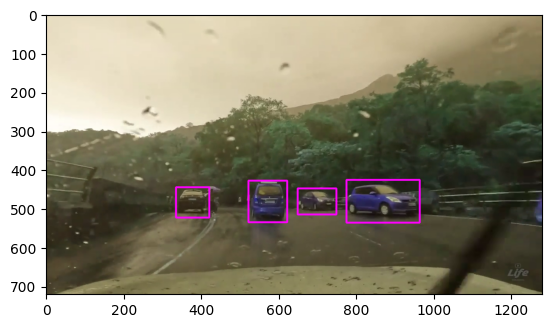

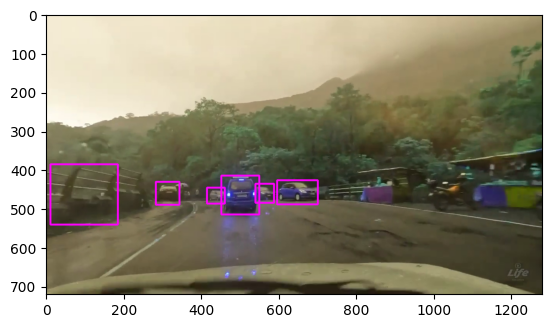

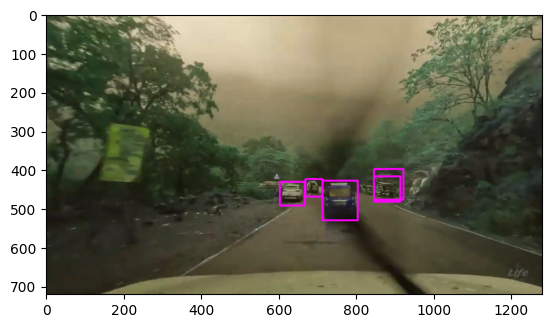

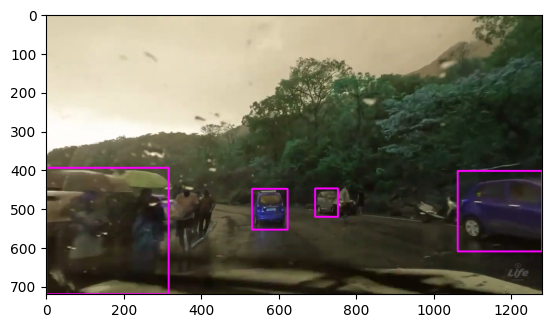

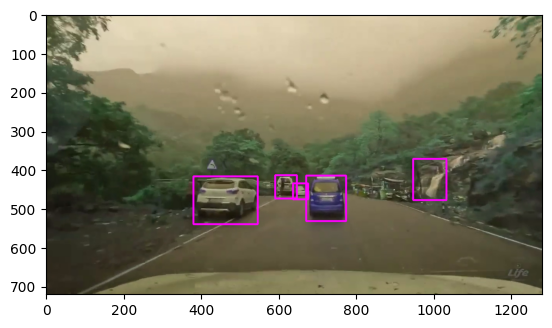

...

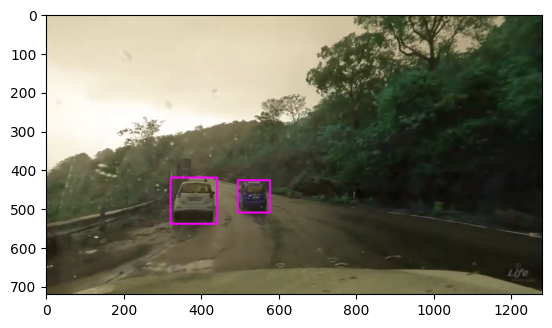

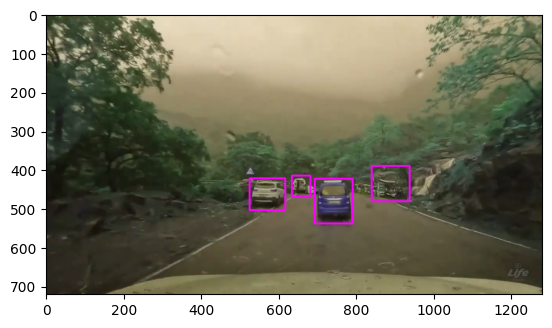

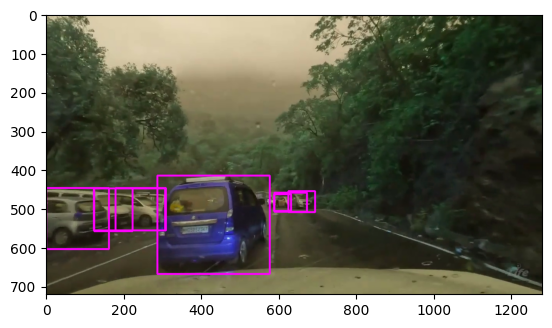

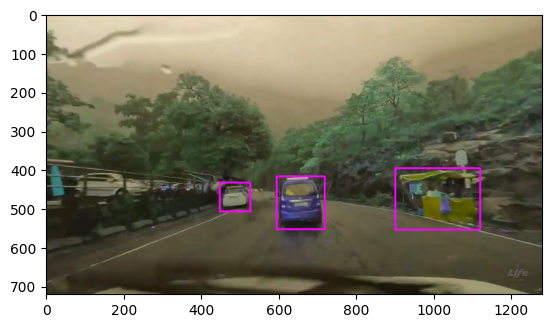

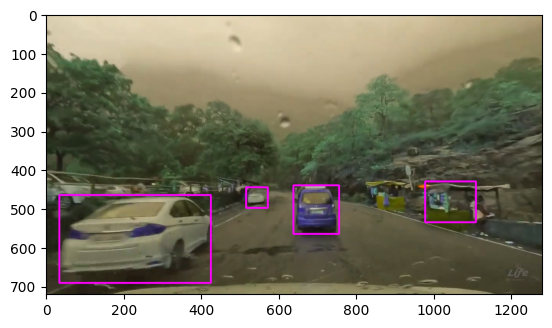

In [ ]:
import random
from PIL import Image
from torchvision import transforms

for x in random.sample(os.listdir('frames'), k=30):
    img = Image.open('frames/' + x)
    img = transforms.PILToTensor()(img)
    img = img.type(torch.float)
    img = img.unsqueeze(dim=0)
    img = transforms.Resize((448, 448), antialias=True)(img)
    img = img.to(DEVICE)
    for idx in range(1):
        bboxes = cellboxes_to_boxes(model(img))
        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, prob_threshold=0.4, box_format="midpoint")
        plot_image(img[0].permute(1,2,0).to("cpu").type(torch.int), bboxes)

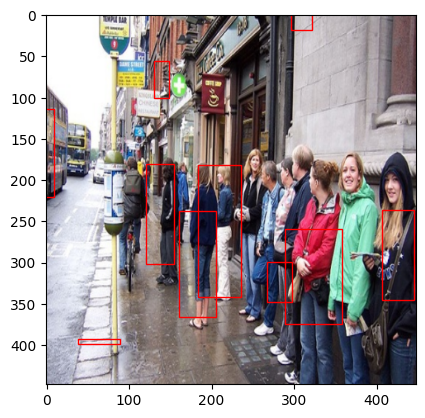

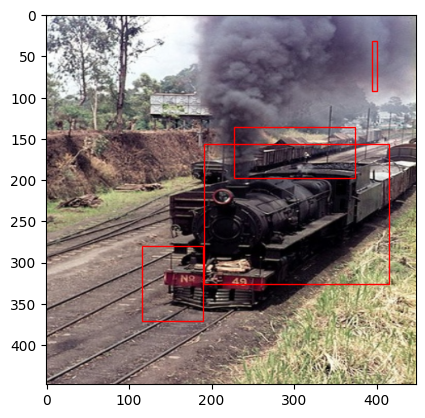

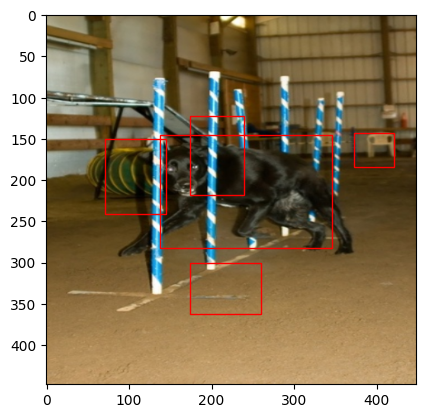

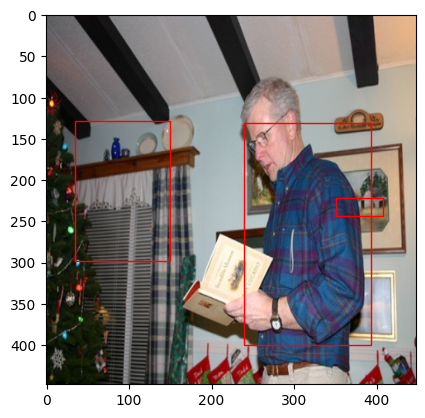

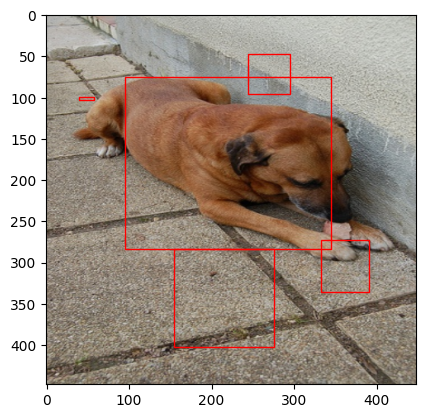

...

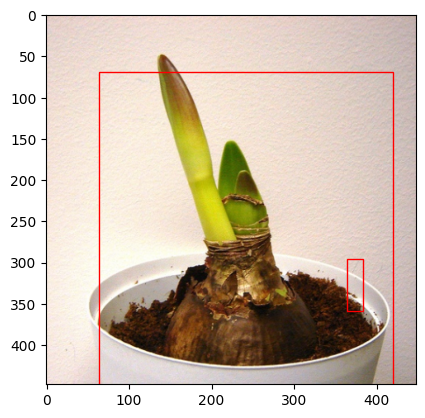

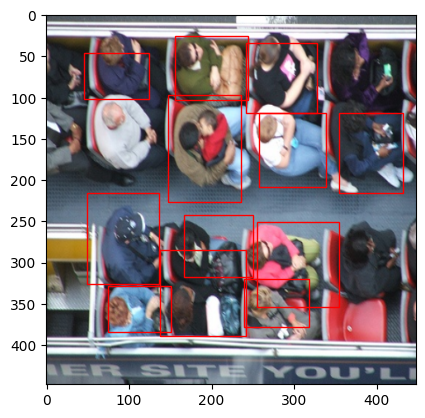

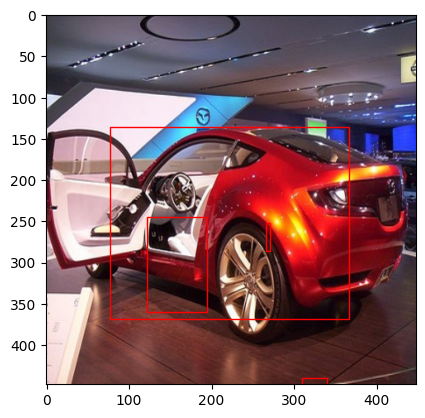

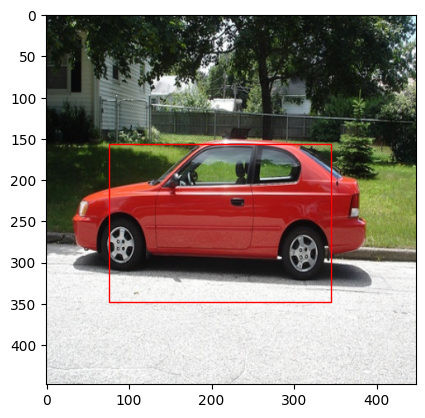

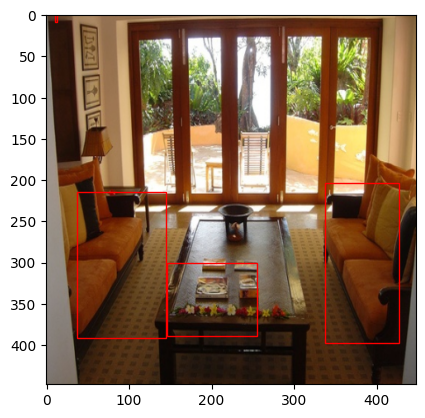

In [25]:
for x, y in train_loader:
    x = x.to(DEVICE)
    for idx in range(8):
        bboxes = cellboxes_to_boxes(model(x))
        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, prob_threshold=0.4, box_format="midpoint")
        plot_image(x[idx].permute(1,2,0).to("cpu"), bboxes)

## Going Modular

In [27]:
%%writefile dataset.py
import os
import torch
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset

class VOCDataset(Dataset):
    def __init__(self,
                 csv_file,
                 img_dir,
                 label_dir,
                 S=7,
                 B=2,
                 C=20,
                 transform=None):
        super().__init__()
        self.annotations = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.S = S
        self.B = B
        self.C = C

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, index):
        label_path = os.path.join(self.label_dir, self.annotations.iloc[index, 1])
        boxes = []

        with open(label_path) as f:
            for label in f.readlines():
                class_label, x, y, width, height = [
                    float(x) if float(x) != int(float(x)) else int(x)
                    for x in label.replace("\n", "").split()
                ]

                boxes.append([class_label, x, y, width, height])

        img_path = os.path.join(self.img_dir, self.annotations.iloc[index, 0])
        image = Image.open(img_path)
        boxes = torch.tensor(boxes)

        if self.transform:
            # image = self.transform(image)
            image, boxes = self.transform(image, boxes)

        # Convert To Cells
        label_matrix = torch.zeros((self.S, self.S, self.C + 5 * self.B))

        for box in boxes:
            class_label, x, y, width, height = box.tolist()
            class_label = int(class_label)

            # i,j represents the cell row and cell column
            i, j = int(self.S * y), int(self.S * x)
            x_cell, y_cell = self.S * x - j, self.S * y - i

            """
            Calculating the width and height of cell of bounding box,
            relative to the cell is done by the following, with
            width as the example:
            
            width_pixels = (width*self.image_width)
            cell_pixels = (self.image_width)
            
            Then to find the width relative to the cell is simply:
            width_pixels/cell_pixels, simplification leads to the
            formulas below.
            """
            width_cell, height_cell = (
                width * self.S,
                height * self.S,
            )

            # If no object already found for specific cell i,j
            # Note: This means we restrict to ONE object per cell!
            if label_matrix[i, j, 20] == 0:
                # Set that there exists an object
                label_matrix[i, j, 20] = 1

                # Box coordinates
                box_coordinates = torch.tensor(
                    [x_cell, y_cell, width_cell, height_cell]
                )

                label_matrix[i, j, 21:25] = box_coordinates

                # Set one hot encoding for class_label
                label_matrix[i, j, class_label] = 1

        return image, label_matrix

Overwriting dataset.py


In [28]:
%%writefile model.py
import torch
from torch import nn

architecture_config = [
    (7, 64, 2, 3),
    "M",
    (3, 192, 1, 1),
    "M",
    (1, 128, 1, 0),
    (3, 256, 1, 1),
    (1, 256, 1, 0),
    (3, 512, 1, 1),
    "M",
    # List: tuples and the last integer represents number of repeats
    [(1, 256, 1, 0), (3, 512, 1, 1), 4],
    (1, 512, 1, 0),
    (3, 1024, 1, 1),
    "M",
    [(1, 512, 1, 0), (3, 1024, 1, 1), 2],
    (3, 1024, 1, 1),
    (3, 1024, 2, 1),
    (3, 1024, 1, 1),
    (3, 1024, 1, 1),
    # Fully Connected layers not included
]


class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super().__init__()
        self.conv = nn.Conv2d(in_channels=in_channels,
                              out_channels=out_channels,
                              **kwargs)
        self.batchnorm = nn.BatchNorm2d(num_features=out_channels)
        self.leakyrelu = nn.LeakyReLU(negative_slope=0.1, inplace=True)

    def forward(self, x):
        return self.leakyrelu(self.batchnorm(self.conv(x)))
    

class YOLOv1(nn.Module):
    def __init__(self, in_channels=3, **kwargs):
        super().__init__()
        self.architecture = architecture_config
        self.in_channels = in_channels
        self.darknet = self._create_conv_layers(self.architecture)
        self.fcs = self._create_fcs(**kwargs)

    def forward(self, x):
        x = self.darknet(x)
        return self.fcs(torch.flatten(x, start_dim=1))
    
    def _create_conv_layers(self, architecture):
        layers = []
        in_channels = self.in_channels

        for x in architecture:
            if type(x) == tuple:
                layers += [
                    CNNBlock(
                        in_channels,
                        x[1],
                        kernel_size=x[0],
                        stride=x[2],
                        padding=x[3],
                    )
                ]

                in_channels = x[1]

            elif type(x) == str:
                layers += [nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))]

            elif type(x) == list:
                conv1 = x[0] # Tuple
                conv2 = x[1] # Tuple
                num_repeats = x[2] # Integer

                for _ in range(num_repeats):
                    layers += [
                        CNNBlock(
                            in_channels,
                            conv1[1],
                            kernel_size=conv1[0],
                            stride=conv1[2],
                            padding=conv1[3],
                        )
                    ]

                    layers += [
                        CNNBlock(
                            conv1[1],
                            conv2[1],
                            kernel_size=conv2[0],
                            stride=conv2[2],
                            padding=conv2[3],
                        )
                    ]

                    in_channels = conv2[1]

        return nn.Sequential(*layers)
    
    def _create_fcs(self, split_size, num_boxes, num_classes):
        S, B, C = split_size, num_boxes, num_classes

        # In original paper this should be
        # nn.Linear(1024*S*S, 4096),
        # nn.LeakyReLU(0.1),
        # nn.Linear(4096, S*S*(B*5+C))

        return nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=1024 * S * S, out_features=496),
            nn.Dropout(p=0.2),
            nn.LeakyReLU(negative_slope=0.1),
            nn.Linear(in_features=496, out_features=S * S * (C + B * 5)),
        )

Overwriting model.py


In [29]:
%%writefile utils.py
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import Counter


def intersection_over_union(bbox_preds,
                            bbox_true,
                            box_format="midpoint"):
    """
    Calculates intersection over union

    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct Labels of Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes (x,y,w,h) or (x1,y1,x2,y2)

    Returns:
        tensor: Intersection over union for all examples
    """

    # Slicing idx:idx+1 in order to keep tensor dimensionality
    # Doing ... in indexing if there would be additional dimensions
    # Like for Yolo algorithm which would have (N, S, S, 4) in shape

    if box_format == 'midpoint':
        box1_x1 = bbox_preds[..., 0:1] - bbox_preds[..., 2:3] / 2
        box1_y1 = bbox_preds[..., 1:2] - bbox_preds[..., 3:4] / 2
        box1_x2 = bbox_preds[..., 0:1] + bbox_preds[..., 2:3] / 2
        box1_y2 = bbox_preds[..., 1:2] + bbox_preds[..., 3:4] / 2

        box2_x1 = bbox_true[..., 0:1] - bbox_true[..., 2:3] / 2
        box2_y1 = bbox_true[..., 1:2] - bbox_true[..., 3:4] / 2
        box2_x2 = bbox_true[..., 0:1] + bbox_true[..., 2:3] / 2
        box2_y2 = bbox_true[..., 1:2] + bbox_true[..., 3:4] / 2

    elif box_format == 'corners':
        box1_x1 = bbox_preds[..., 0:1]
        box1_y1 = bbox_preds[..., 1:2]
        box1_x2 = bbox_preds[..., 2:3]
        box1_y2 = bbox_preds[..., 3:4] # (N, 1)

        box2_x1 = bbox_true[..., 0:1]
        box2_y1 = bbox_true[..., 1:2]
        box2_x2 = bbox_true[..., 2:3]
        box2_y2 = bbox_true[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    # .clamp(0) is for the case when they do not intersect
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    box1_area = abs((box1_x2 - box1_x1)) * (box1_y2 - box1_y1)
    box2_area = abs((box2_x2 - box2_x1)) * (box2_y2 - box2_y1)

    union = box1_area + box2_area - intersection + 1e-6

    return intersection / union


def non_max_suppression(bbox_preds,
                        iou_threshold,
                        prob_threshold,
                        box_format='corners'):
    """
    Does Non Max Suppression given bboxes

    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU) 
        box_format (str): "midpoint" or "corners" used to specify bboxes

    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """
    
    # predictions = [[1, 0.9, x1, y1, x2, y2]]

    assert type(bbox_preds) == list

    bboxes = [box for box in bbox_preds if box[1] > prob_threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms


def mean_average_precision(bbox_preds,
                           bbox_true,
                           iou_threshold=0.5,
                           box_format="midpoint",
                           num_classes=20):
    """
    Calculates mean average precision 

    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones 
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes

    Returns:
        float: mAP value across all classes given a specific IoU threshold 
    """

    # bbox_preds (list): [[train_idx, class_pred, prob_score, x1, y1, x2, y2], ...]

    # List storing all AP for respective classes
    average_precisions = []

    # Used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets and only add the ones that belong to the current class c
        for detection in bbox_preds:
            if detection[1] == c:
                detections.append(detection)

        for true_box in bbox_true:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get for each training example
        # So let's say img 0 has 3 bboxes, img 1 has 5 bboxes then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # Sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)

        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same training idx as detection
            ground_truth_img = [bbox for bbox in ground_truths if bbox[0] == detection[0]]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1
        
        # [1, 1, 0, 1, 0] -> [1, 2, 2, 3, 3]
        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)

        recalls = torch.divide(TP_cumsum, (total_true_bboxes + epsilon))
        recalls = torch.cat((torch.tensor([0]), recalls))

        precisions = torch.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))
        precisions = torch.cat((torch.tensor([1]), precisions))

        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)


def plot_image(image, boxes):
    """Plots predicted bounding boxes on the image"""
    im = np.array(image)
    height, width, _ = im.shape

    # Create figure and axes
    fig, ax = plt.subplots(1)
    # Display the image
    ax.imshow(im)

    # box[0] is x midpoint, box[2] is width
    # box[1] is y midpoint, box[3] is height

    # Create a Rectangle potch
    for box in boxes:
        box = box[2:]
        assert len(box) == 4, "Got more values than in x, y, w, h, in a box!"
        upper_left_x = box[0] - box[2] / 2
        upper_left_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (upper_left_x * width, upper_left_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()


def convert_cellboxes(predictions, S=7):
    """
    Converts bounding boxes output from Yolo with
    an image split size of S into entire image ratios
    rather than relative to cell ratios. Tried to do this
    vectorized, but this resulted in quite difficult to read
    code... Use as a black box? Or implement a more intuitive,
    using 2 for loops iterating range(S) and convert them one
    by one, resulting in a slower but more readable implementation.
    """

    predictions = predictions.to("cpu")
    batch_size = predictions.shape[0]
    predictions = predictions.reshape(batch_size, 7, 7, 30)
    bboxes1 = predictions[..., 21:25]
    bboxes2 = predictions[..., 26:30]
    scores = torch.cat(
        (predictions[..., 20].unsqueeze(0), predictions[..., 25].unsqueeze(0)), dim=0
    )
    best_box = scores.argmax(0).unsqueeze(-1)
    best_boxes = bboxes1 * (1 - best_box) + best_box * bboxes2
    cell_indices = torch.arange(7).repeat(batch_size, 7, 1).unsqueeze(-1)
    x = 1 / S * (best_boxes[..., :1] + cell_indices)
    y = 1 / S * (best_boxes[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    w_y = 1 / S * best_boxes[..., 2:4]
    converted_bboxes = torch.cat((x, y, w_y), dim=-1)
    predicted_class = predictions[..., :20].argmax(-1).unsqueeze(-1)
    best_confidence = torch.max(predictions[..., 20], predictions[..., 25]).unsqueeze(
        -1
    )
    converted_preds = torch.cat(
        (predicted_class, best_confidence, converted_bboxes), dim=-1
    )

    return converted_preds


def cellboxes_to_boxes(out, S=7):
    converted_pred = convert_cellboxes(out).reshape(out.shape[0], S * S, -1)
    converted_pred[..., 0] = converted_pred[..., 0].long()
    all_bboxes = []

    for ex_idx in range(out.shape[0]):
        bboxes = []

        for bbox_idx in range(S * S):
            bboxes.append([x.item() for x in converted_pred[ex_idx, bbox_idx, :]])
        all_bboxes.append(bboxes)

    return all_bboxes


def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
):
    all_pred_boxes = []
    all_true_boxes = []

    # make sure model is in eval before get bboxes
    model.eval()
    train_idx = 0

    for batch_idx, (x, labels) in enumerate(loader):
        x = x.to(device)
        labels = labels.to(device)

        with torch.inference_mode():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                prob_threshold=threshold,
                box_format=box_format,
            )


            #if batch_idx == 0 and idx == 0:
            #    plot_image(x[idx].permute(1,2,0).to("cpu"), nms_boxes)
            #    print(nms_boxes)

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                # many will get converted to 0 pred
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes


def save_checkpoint(state, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

Overwriting utils.py


In [30]:
%%writefile loss.py
import torch
import torch.nn as nn
from utils import intersection_over_union

class YoloLoss(nn.Module):
    def __init__(self, S=7, B=2, C=20):
        super().__init__()
        self.mse = nn.MSELoss(reduction="sum")

        """
        S is split size of image (in paper 7),
        B is number of boxes (in paper 2),
        C is number of classes (in paper and VOC dataset is 20),
        """
        self.S = S
        self.B = B
        self.C = C

        # These are from Yolo paper, signifying how much we should
        # pay loss for no object (noobj) and the box coordinates (coord)
        self.lambda_noobj = 0.5
        self.lambda_coord = 5

    def forward(self, predictions, target):
        # predictions are shaped (BATCH_SIZE, S*S(C+B*5) when inputted
        predictions = predictions.reshape(-1, self.S, self.S, self.C + self.B * 5)

        # Calculate IoU for the two predicted bounding boxes with target bbox
        iou_b1 = intersection_over_union(predictions[..., 21:25], target[..., 21:25])
        iou_b2 = intersection_over_union(predictions[..., 26:30], target[..., 21:25])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        # Take the box with highest IoU out of the two prediction
        # Note that bestbox will be indices of 0, 1 for which bbox was best
        iou_maxes, bestbox = torch.max(ious, dim=0)
        exists_box = target[..., 20].unsqueeze(3)  # in paper this is Iobj_i

        # ======================== #
        #   FOR BOX COORDINATES    #
        # ======================== #

        # Set boxes with no object in them to 0. We only take out one of the two 
        # predictions, which is the one with highest Iou calculated previously.
        box_predictions = exists_box * (
            (
                bestbox * predictions[..., 26:30]
                + (1 - bestbox) * predictions[..., 21:25]
            )
        )

        box_targets = exists_box * target[..., 21:25]

        # Take sqrt of width, height of boxes to ensure that
        box_predictions[..., 2:4] = torch.sign(box_predictions[..., 2:4]) * torch.sqrt(
            torch.abs(box_predictions[..., 2:4] + 1e-6)
        )
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(
            torch.flatten(box_predictions, end_dim=-2),
            torch.flatten(box_targets, end_dim=-2),
        )

        # ==================== #
        #   FOR OBJECT LOSS    #
        # ==================== #

        # pred_box is the confidence score for the bbox with highest IoU
        pred_box = (
            bestbox * predictions[..., 25:26] + (1 - bestbox) * predictions[..., 20:21]
        )

        object_loss = self.mse(
            torch.flatten(exists_box * pred_box),
            torch.flatten(exists_box * target[..., 20:21]),
        )

        # ======================= #
        #   FOR NO OBJECT LOSS    #
        # ======================= #

        #max_no_obj = torch.max(predictions[..., 20:21], predictions[..., 25:26])
        #no_object_loss = self.mse(
        #    torch.flatten((1 - exists_box) * max_no_obj, start_dim=1),
        #    torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        #)

        no_object_loss = self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 20:21], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        )

        no_object_loss += self.mse(
            torch.flatten((1 - exists_box) * predictions[..., 25:26], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1)
        )

        # ================== #
        #   FOR CLASS LOSS   #
        # ================== #

        class_loss = self.mse(
            torch.flatten(exists_box * predictions[..., :20], end_dim=-2,),
            torch.flatten(exists_box * target[..., :20], end_dim=-2,),
        )

        loss = (
            self.lambda_coord * box_loss  # first two rows in paper
            + object_loss  # third row in paper
            + self.lambda_noobj * no_object_loss  # fourth row
            + class_loss  # fifth row
        )

        return loss

Overwriting loss.py


In [31]:
%%writefile train.py
import torch
import torchvision.transforms as transforms
from tqdm import tqdm
from torch.utils.data import DataLoader
from model import YOLOv1
from dataset import VOCDataset
from utils import (
    non_max_suppression,
    mean_average_precision,
    intersection_over_union,
    cellboxes_to_boxes,
    get_bboxes,
    plot_image,
    save_checkpoint,
    load_checkpoint,
)
from loss import YoloLoss

torch.manual_seed(42)

# Hyperparameter settings
LEARNING_RATE = 2e-5
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 100
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = False
LOAD_MODEL_FILE = 'models/overfit.pth.tar'
IMG_DIR = 'PascalVOC/images'
LABEL_DIR = 'PascalVOC/labels'


class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes

        return img, bboxes
    

transform = Compose([transforms.Resize((448, 448)),
                     transforms.ToTensor()])


def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []

    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # update progress bar
        loop.set_postfix(loss=loss.item())

    print(f"Mean loss was {sum(mean_loss)/len(mean_loss)}")
    print(f"\n{'-'*20}\n")


def main():
    model = YOLOv1(split_size=7,
                   num_boxes=2,
                   num_classes=20).to(DEVICE)

    optimizer = torch.optim.Adam(params=model.parameters(),
                                 lr=LEARNING_RATE,
                                 weight_decay=WEIGHT_DECAY)

    loss_fn = YoloLoss()

    if LOAD_MODEL:
        load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)

    train_dataset = VOCDataset(
        "PascalVOC/100examples.csv",
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )

    test_dataset = VOCDataset(
        "PascalVOC/test.csv",
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )

    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=True,
    )

    test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=True,
    )

    for epoch in range(EPOCHS):
        # for x, y in train_loader:
        #    x = x.to(DEVICE)
        #    for idx in range(8):
        #        bboxes = cellboxes_to_boxes(model(x))
        #        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, threshold=0.4, box_format="midpoint")
        #        plot_image(x[idx].permute(1,2,0).to("cpu"), bboxes)

        #    import sys
        #    sys.exit()

        pred_boxes, target_boxes = get_bboxes(
            train_loader, model, iou_threshold=0.5, threshold=0.4, device=DEVICE
        )

        mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format="midpoint"
        )

        print(f'Epoch - {epoch}')
        print(f"Train mAP: {mean_avg_prec:.5}")

        if mean_avg_prec > 0.9:
            checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
            }
            save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)

        train_fn(train_loader, model, optimizer, loss_fn)


if __name__ == '__main__':
    main()

Overwriting train.py
